<a href="https://colab.research.google.com/github/Ango-Jay/ANPR-SYS/blob/main/Anpr_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
from matplotlib import pyplot as plt
import numpy as np
import imutils

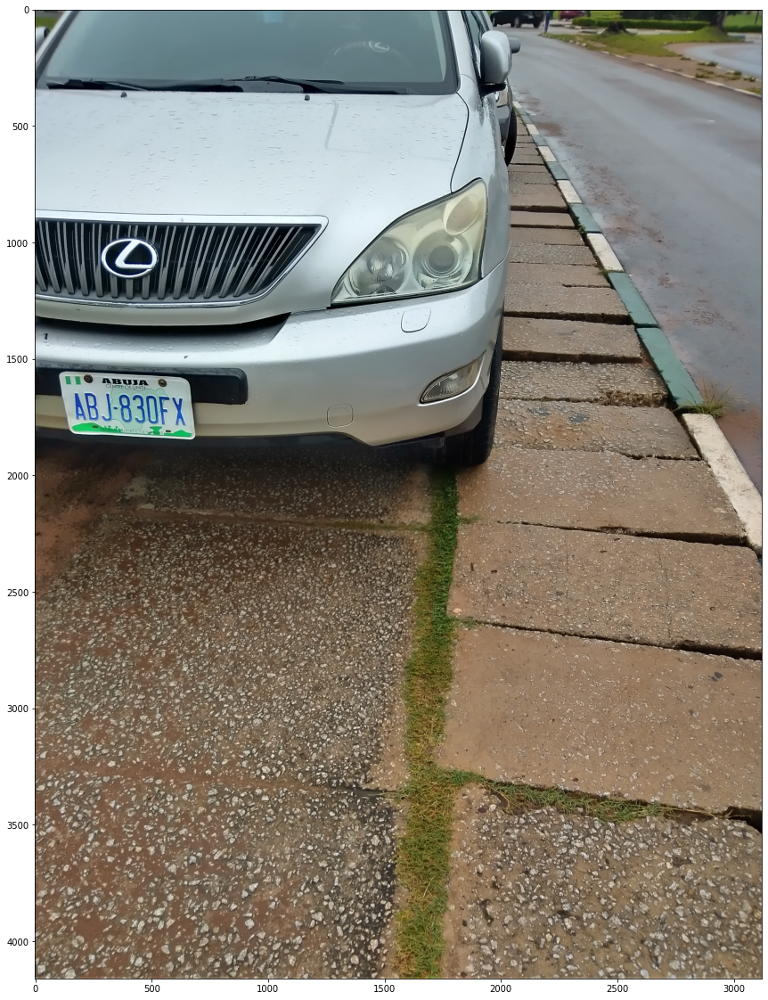

In [ ]:
 # IMAGE ACCQUISITION
 
# TEST IMAGES
# FRONT
img = cv2.imread('/content/drive/MyDrive/IMG_20210601_131826.jpg')
#img = cv2.imread('/content/drive/MyDrive/IMG_20210514_102607.jpg')
# REAR
#img = cv2.imread('/content/drive/MyDrive/try.jpg')
#img = cv2.imread('/content/drive/MyDrive/IMG_20210429_133932.jpg')
#img = cv2.imread('/content/drive/MyDrive/img_225~2.jpg')
plt.figure(figsize=(40,20))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

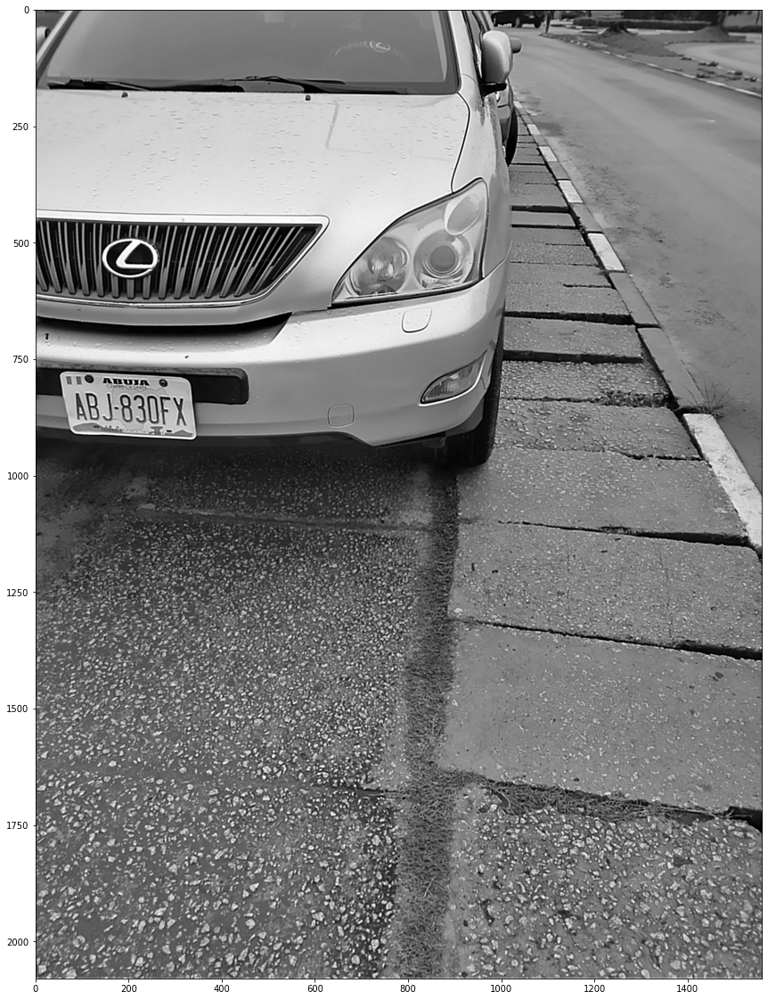

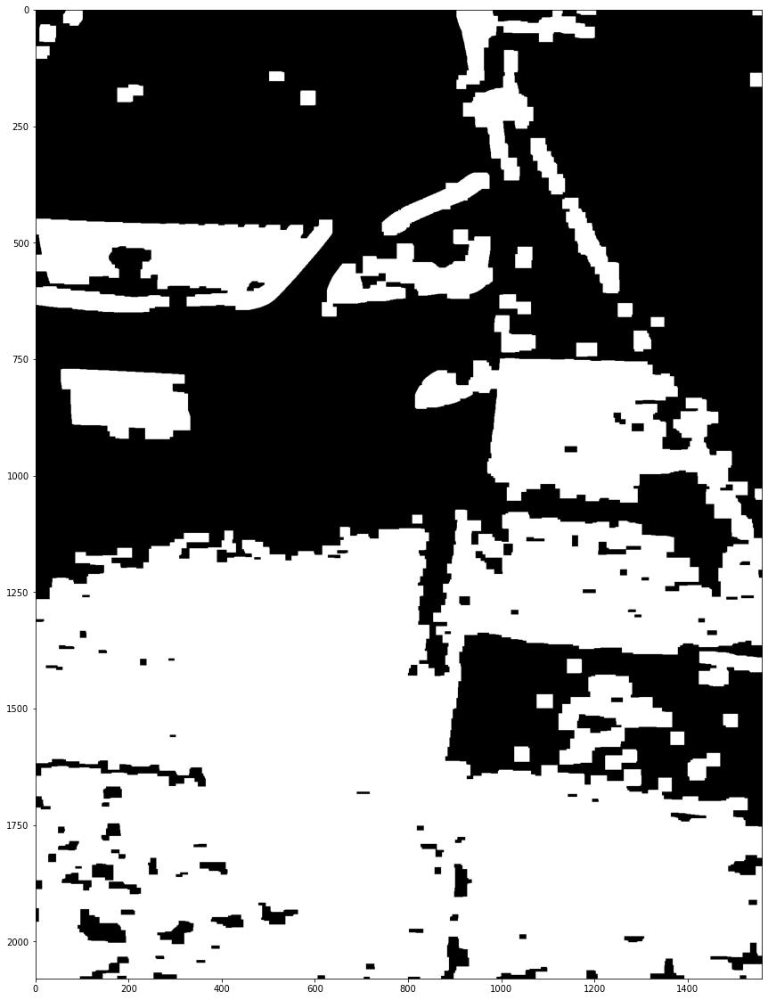

In [ ]:
# IMAGE PRE-PROCESSING STAGE
# Preprocessing for 
 # FRONT FACING ONLY
 
scale_percent = 50
 
#calculate the 50 percent of original dimensions
width = int(img.shape[1] * scale_percent / 100)
height = int(img.shape[0] * scale_percent / 100)
 
# dsize
dsize = (width, height)
img = cv2.resize(img, dsize)
 
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray = cv2.GaussianBlur(gray, (7,7), 0)
sharp_filter = np.array([
                         [-1, -1, -1],[-1, 9, -1], [-1, -1, -1]
])
gray = cv2.filter2D(gray, -1, sharp_filter)
 
plt.figure(figsize=(40,20))
plt.imshow(cv2.cvtColor(gray, cv2.COLOR_BGR2RGB))
 
 
rect_kern = cv2.getStructuringElement(cv2.MORPH_RECT, (15, 7))
black_hat = cv2.morphologyEx(gray, cv2.MORPH_BLACKHAT, rect_kern)
black_hat = cv2.threshold(black_hat, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
 
sq_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
light = cv2.morphologyEx(gray, cv2.MORPH_CLOSE, sq_kernel)
light = cv2.threshold(light, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
 
gradx = cv2.Sobel(black_hat, cv2.CV_32F, 1, 0, -1)
gradx = np.absolute(gradx)
(minVal, maxVal) = (np.min(gradx), np.max(gradx))
gradx = 255 * ((gradx -minVal)/(maxVal - minVal))
gradx = gradx.astype("uint8")
gradx = cv2.morphologyEx(gradx, cv2.MORPH_CLOSE, rect_kern)
 
thresh = cv2.threshold(gradx, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
thresh = cv2.erode(thresh, None, iterations=4)
thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, rect_kern)
thresh = cv2.dilate(thresh, None, iterations=5)
thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, rect_kern)
thresh = cv2.dilate(thresh, None, iterations=3)
thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, rect_kern)
thresh = cv2.bitwise_and(thresh, thresh, mask=light)
thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, rect_kern)
thresh = cv2.erode(thresh, None, iterations=3)
thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, rect_kern)
thresh = cv2.dilate(thresh, None, iterations=5)
thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, rect_kern)
thresh = cv2.dilate(thresh, None, iterations=5)
thresh = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, rect_kern)
thresh = cv2.erode(thresh, None, iterations=2)
thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, rect_kern)
thresh = cv2.dilate(thresh, None, iterations=1)
 
plt.figure(figsize=(40,20))
plt.imshow(cv2.cvtColor(thresh, cv2.COLOR_BGR2RGB))

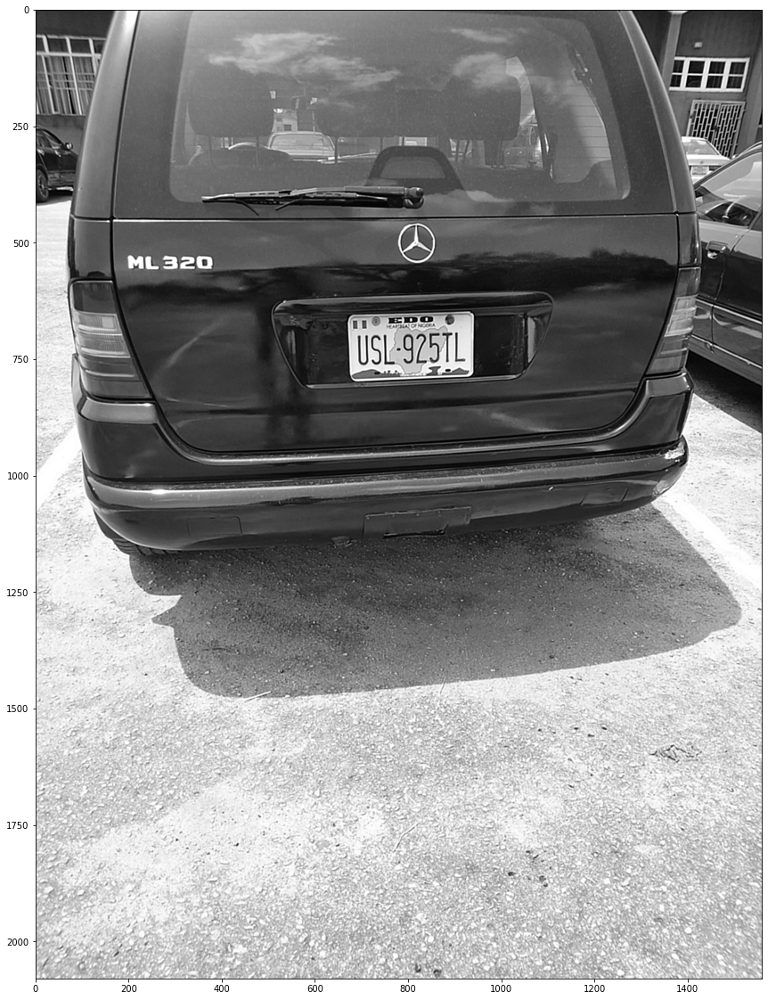

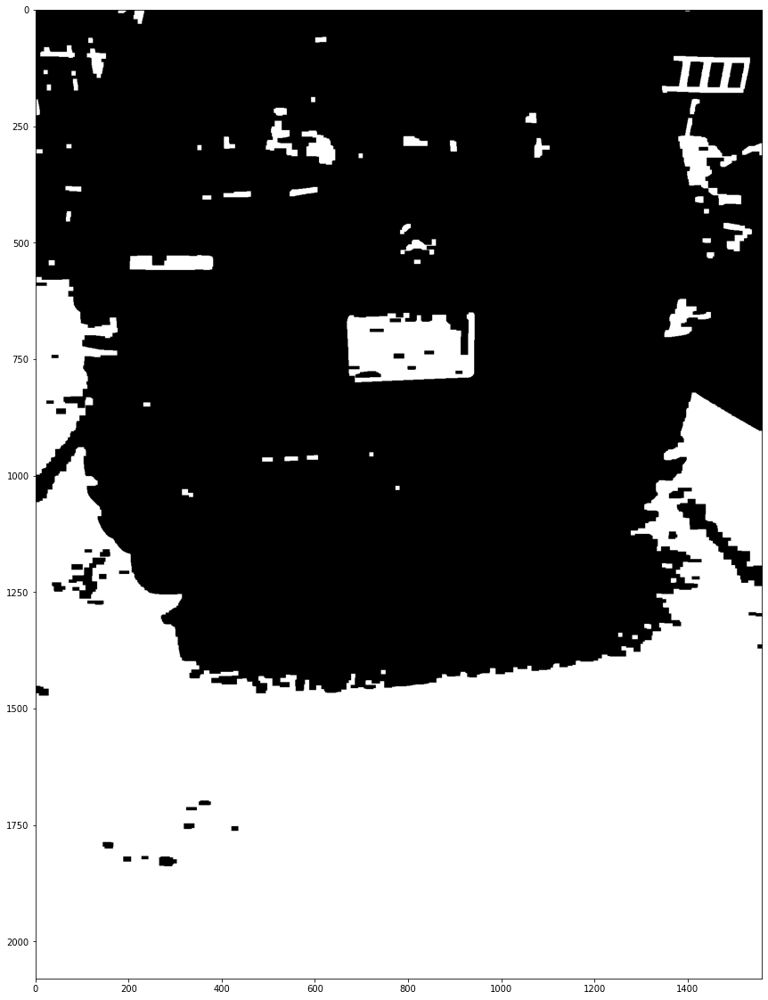

In [ ]:
# IMAGE PRE-PROCESSING STAGE
# preprocessing for 
# REAR FACING PLATES
 
 
scale_percent = 50
 
#calculate the 50 percent of original dimensions
width = int(img.shape[1] * scale_percent / 100)
height = int(img.shape[0] * scale_percent / 100)
 
# dsize
dsize = (width, height)
img = cv2.resize(img, dsize)
 
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray = cv2.GaussianBlur(gray, (7,7), 0)
sharp_filter = np.array([
                         [-1, -1, -1],[-1, 9, -1], [-1, -1, -1]
])
gray = cv2.filter2D(gray, -1, sharp_filter)
 
plt.figure(figsize=(40,20))
plt.imshow(cv2.cvtColor(gray, cv2.COLOR_BGR2RGB))
 
 
rect_kern = cv2.getStructuringElement(cv2.MORPH_RECT, (15, 7))
black_hat = cv2.morphologyEx(gray, cv2.MORPH_BLACKHAT, rect_kern)
black_hat = cv2.threshold(black_hat, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
 
sq_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3,3))
light = cv2.morphologyEx(gray, cv2.MORPH_CLOSE, sq_kernel)
light = cv2.threshold(light, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
 
gradx = cv2.Sobel(black_hat, cv2.CV_32F, 1, 0, -1)
gradx = np.absolute(gradx)
(minVal, maxVal) = (np.min(gradx), np.max(gradx))
gradx = 255 * ((gradx -minVal)/(maxVal - minVal))
gradx = gradx.astype("uint8")
gradx = cv2.morphologyEx(gradx, cv2.MORPH_CLOSE, rect_kern)
 
thresh = cv2.threshold(gradx, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
thresh = cv2.dilate(thresh, None, iterations=3)
thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, rect_kern)
thresh = cv2.bitwise_and(thresh, thresh, mask=light)
thresh = cv2.erode(thresh, None, iterations=2)
thresh = cv2.dilate(thresh, None, iterations=4)
thresh = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, rect_kern)
 
 
 
 
plt.figure(figsize=(40,20))
plt.imshow(cv2.cvtColor(thresh, cv2.COLOR_BGR2RGB))

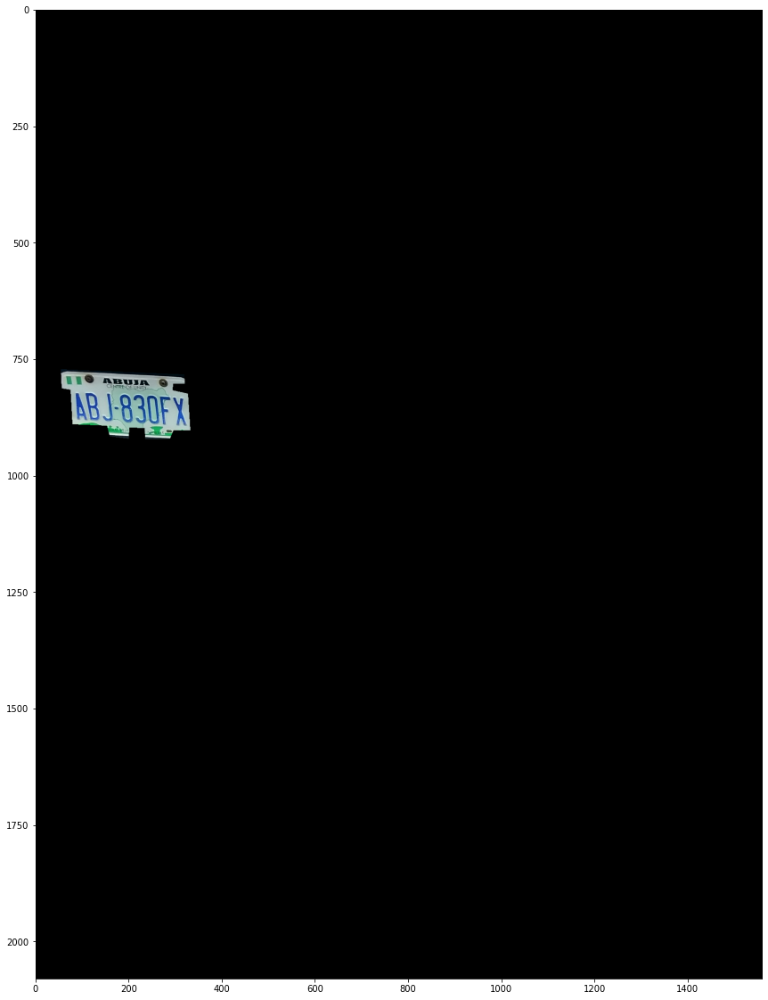

In [ ]:
# IMAGE SEGMENTATION
 
# locate contours using findcontours() function
keypoints = cv2.findContours(thresh.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
# get the contours and store in contours variable
contours = imutils.grab_contours(keypoints)
# sort through the contours using contour area and display only the first 50 in descending order 
contours = sorted(contours, key=cv2.contourArea, reverse=True)[:50]
location = 0
# loop to select contour that fits into aspect ratio range
for contour in contours:
    peri = cv2.arcLength(contour, True)
    approx = cv2.approxPolyDP(contour, 5, True)
    x,y,w,h = cv2.boundingRect(approx)
    aspect_ratio = w / float(h)
    if aspect_ratio >= 1.6 and aspect_ratio <= 2:
        location = approx
        break
mask = np.zeros(gray.shape, np.uint8)
new_image = cv2.drawContours(mask, [location], 0,255, -1)
new_image = cv2.bitwise_and(img, img, mask=mask)
 
plt.figure(figsize=(40, 20)) 
plt.imshow(cv2.cvtColor(new_image, cv2.COLOR_BGR2RGB))

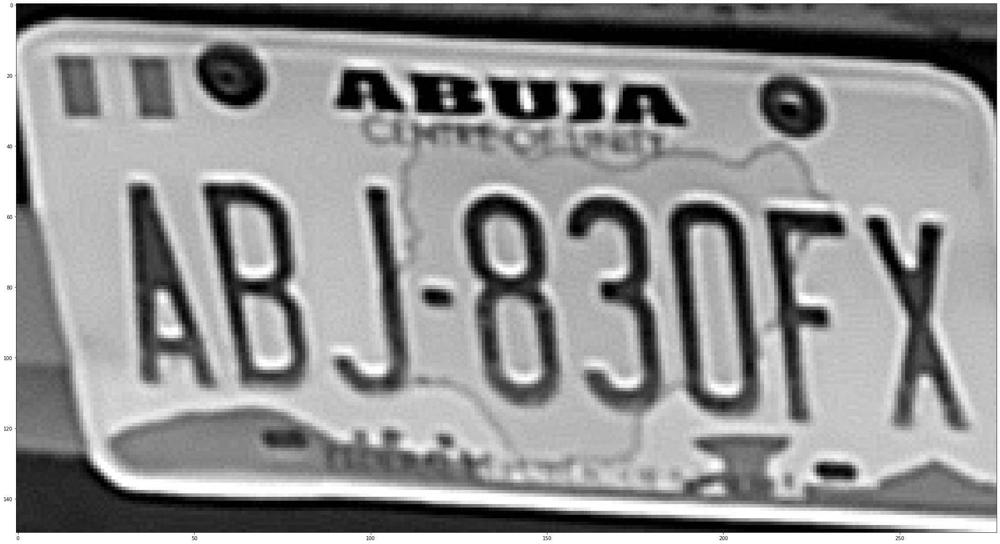

In [ ]:
# NUMBER PLATE DETECTION
# FOR FRONT FACING ONLY
 
 # extracting the contour from mask 
(x,y) = np.where(mask==255)
(x1, y1) = (np.min(x), np.min(y))
(x2, y2) = (np.max(x), np.max(y))
cropped_image = gray[x1:x2+1, y1:y2+1]
cv2.imwrite("img_0.jpg", cropped_image)
cropped_image = cv2.imread('/content/img_0.jpg')
from skimage import img_as_ubyte
cropped_image = img_as_ubyte(cropped_image)
cropped_gray = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2GRAY)
 
plt.figure(figsize=(40, 20)) 
plt.imshow(cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB))

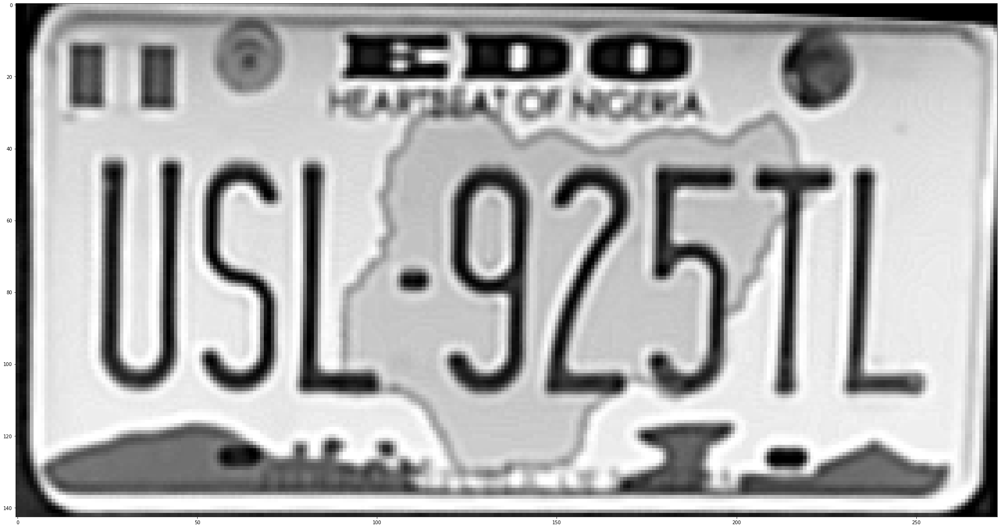

In [ ]:
# NUMBER PLATE DETECTION
# FOR REAR FACING ONLY
 
 # extracting the contour from mask 
(x,y) = np.where(mask==255)
(x1, y1) = (np.min(x), np.min(y))
(x2, y2) = (np.max(x), np.max(y))
cropped_image = gray[x1:x2+1, y1:y2+1]
min_rect = cv2.minAreaRect(location)
((x,y),(w,h),angle) = min_rect
rotate = cv2.getRotationMatrix2D((w/2, h/2), angle, 1.0)
rotated_image = cv2.warpAffine(cropped_image, rotate, (int(w),int(h)))
cv2.imwrite("img_0.jpg", cropped_image)
cropped_image = cv2.imread('/content/img_0.jpg')
from skimage import img_as_ubyte
cropped_image = img_as_ubyte(cropped_image)
cropped_gray = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2GRAY)
 
plt.figure(figsize=(40, 20)) 
plt.imshow(cv2.cvtColor(rotated_image, cv2.COLOR_BGR2RGB))

x: 78 y: 3 w: 4 h: 4 area: 13
x: 103 y: 4 w: 2 h: 4 area: 8
x: 0 y: 6 w: 4 h: 4 area: 10
x: 54 y: 12 w: 12 h: 3 area: 31
x: 12 y: 15 w: 11 h: 17 area: 150
x: 33 y: 16 w: 12 h: 17 area: 150
x: 91 y: 19 w: 19 h: 12 area: 160
x: 110 y: 19 w: 23 h: 13 area: 201
x: 133 y: 21 w: 21 h: 13 area: 197
x: 211 y: 20 w: 18 h: 18 area: 214
x: 156 y: 22 w: 11 h: 12 area: 116
x: 169 y: 23 w: 21 h: 12 area: 164
x: 272 y: 22 w: 6 h: 10 area: 33
x: 55 y: 24 w: 14 h: 6 area: 50
x: 0 y: 26 w: 6 h: 37 area: 117
x: 107 y: 34 w: 2 h: 4 area: 4
x: 113 y: 35 w: 6 h: 3 area: 12
x: 121 y: 35 w: 2 h: 1 area: 2
x: 125 y: 35 w: 3 h: 4 area: 8
x: 131 y: 35 w: 3 h: 3 area: 7
x: 149 y: 37 w: 2 h: 2 area: 3
x: 164 y: 37 w: 2 h: 2 area: 4
x: 169 y: 39 w: 2 h: 3 area: 5
x: 180 y: 38 w: 3 h: 3 area: 5
x: 32 y: 51 w: 25 h: 58 area: 610
x: 53 y: 51 w: 30 h: 58 area: 683
x: 90 y: 52 w: 21 h: 58 area: 377
x: 127 y: 54 w: 27 h: 60 area: 684
x: 156 y: 55 w: 27 h: 60 area: 547
x: 185 y: 57 w: 26 h: 60 area: 661
x: 206 y: 56 w: 1 

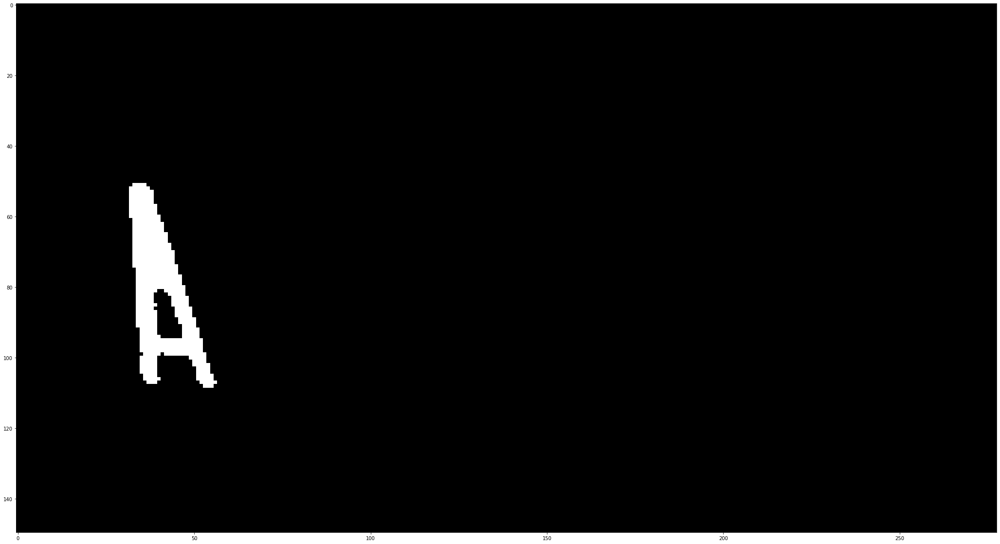

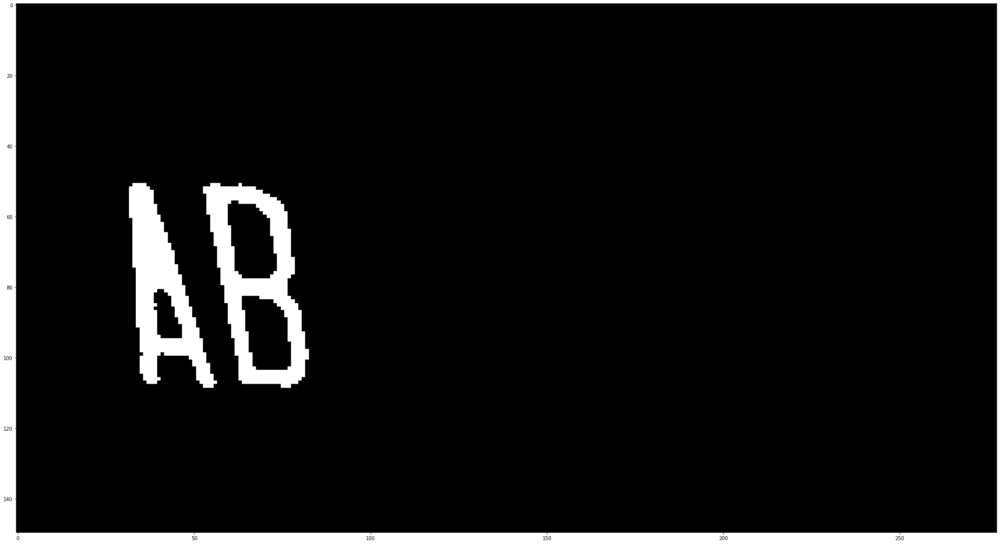

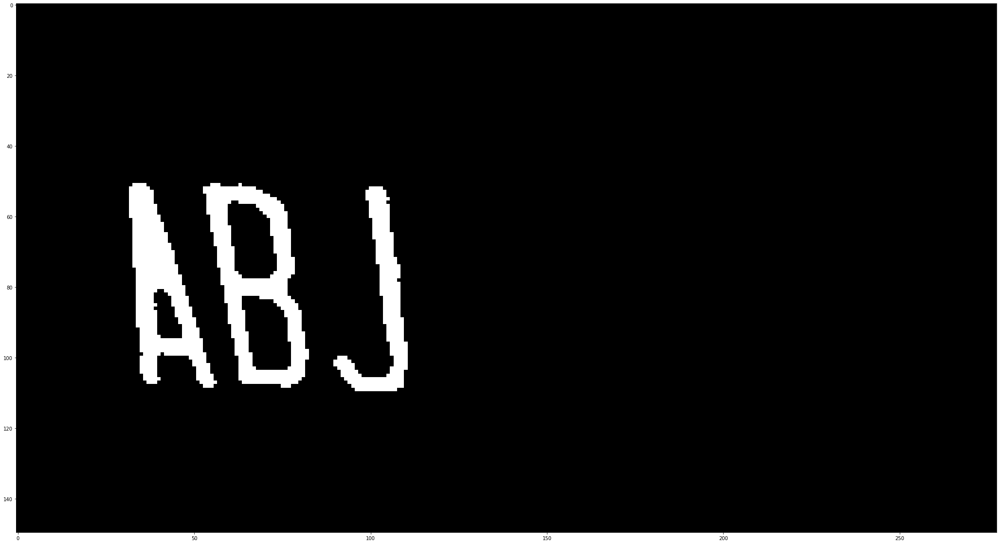

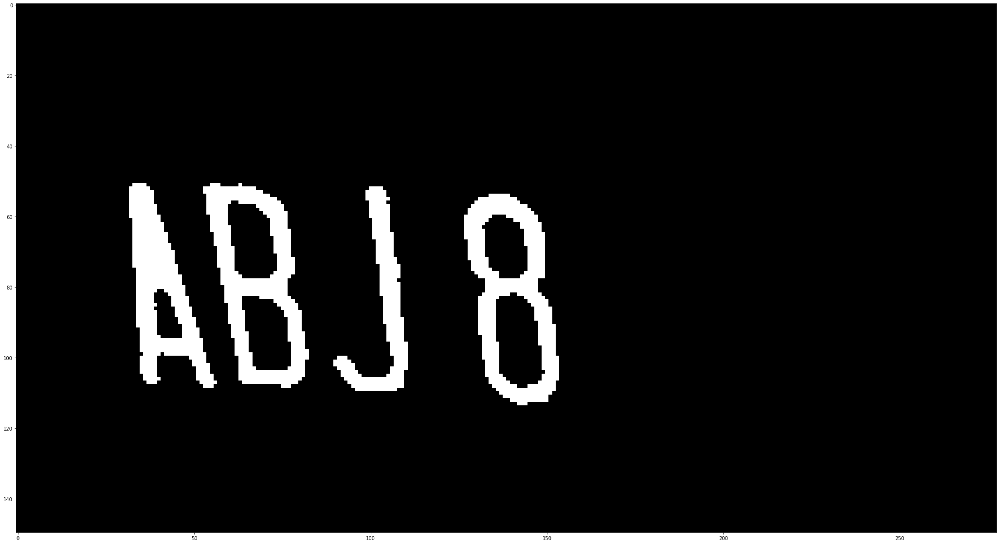

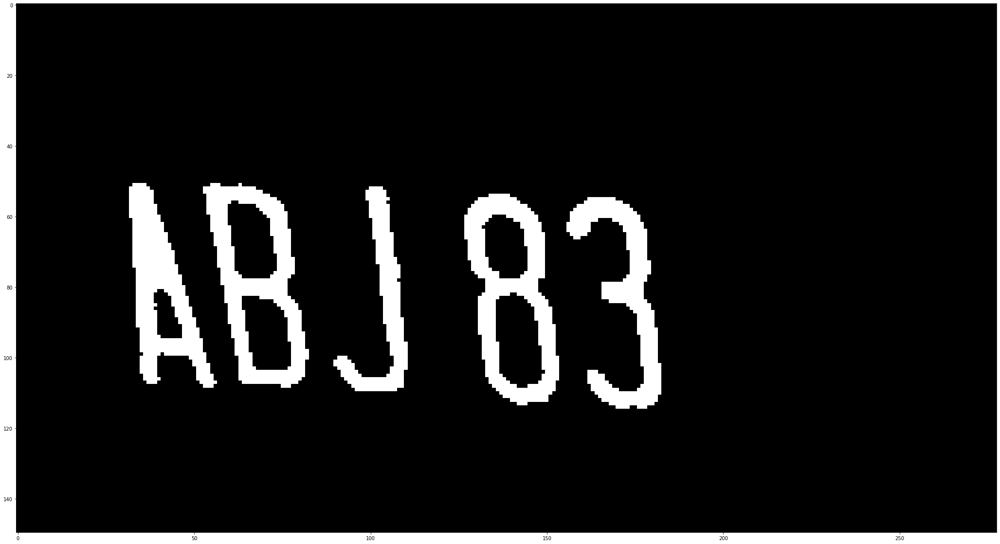

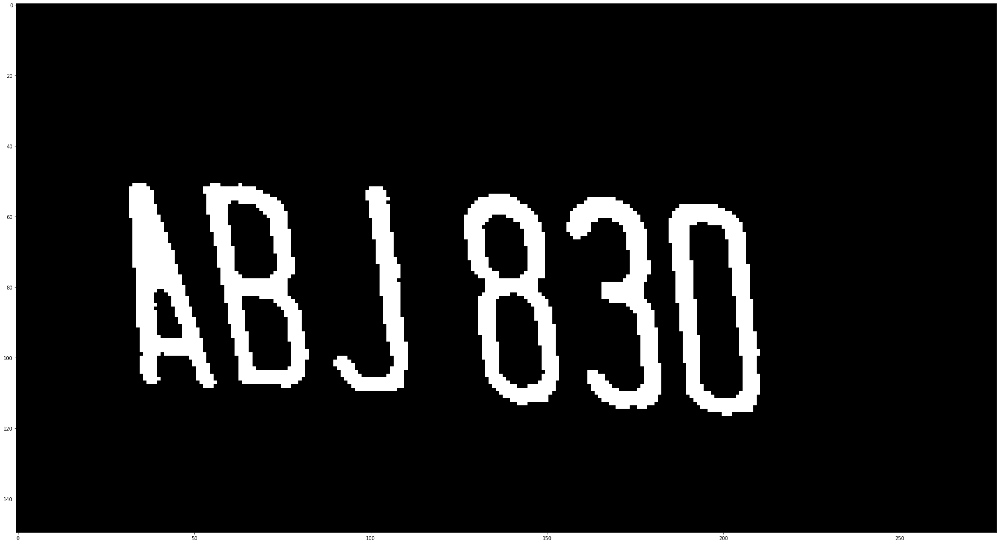

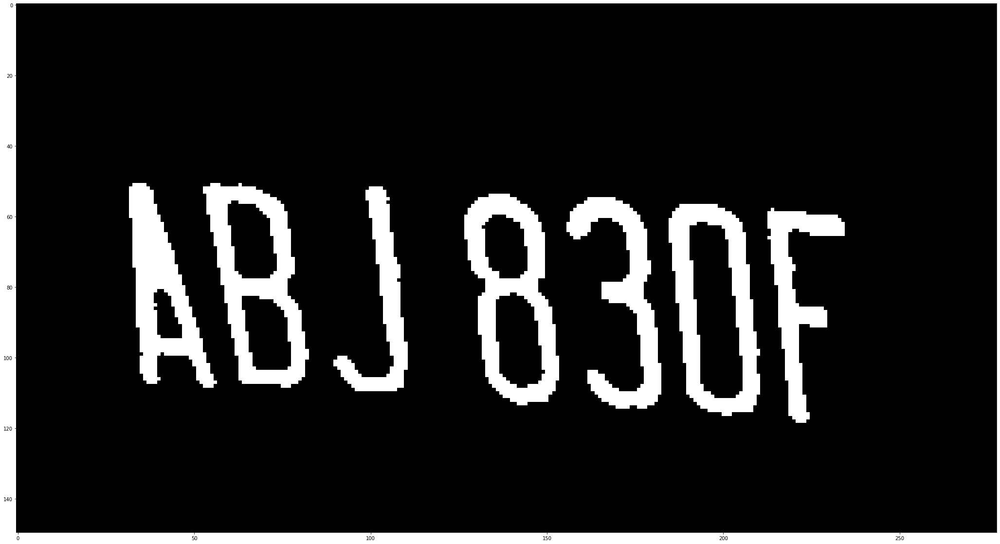

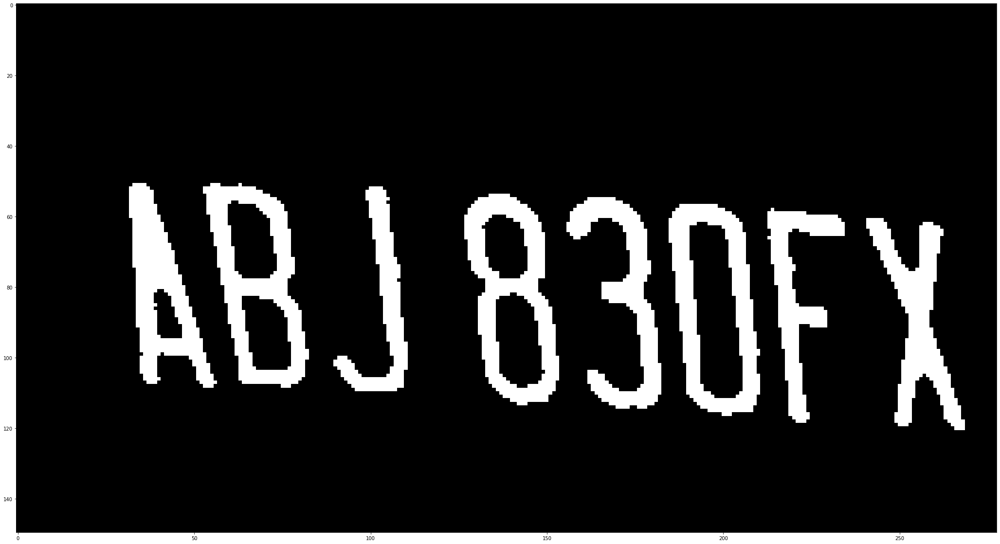

In [ ]:
# NUMBER PLATE SEGMENTATION
 
rect_kern = cv2.getStructuringElement(cv2.MORPH_RECT, (15, 7))
black_hat = cv2.morphologyEx(cropped_gray, cv2.MORPH_BLACKHAT, rect_kern)
char_bh = cv2.threshold(black_hat, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
 
# apply connected component analysis to the thresholded image
output = cv2.connectedComponentsWithStats(
    char_bh.copy(), 8, cv2.CV_32S)
(numLabels, labels, stats, centroids) = output
# initialize an output mask to store all characters parsed from
# the license plate
mask = np.zeros(cropped_gray.shape, dtype="uint8")
# loop over the number of unique connected component labels, skipping
# over the first label (as label zero is the background)
count = 0
character = []
for i in range(1, numLabels):
    # extract the connected component statistics for the current
      # label
    x = stats[i, cv2.CC_STAT_LEFT]
    y = stats[i, cv2.CC_STAT_TOP]
    w = stats[i, cv2.CC_STAT_WIDTH]
    h = stats[i, cv2.CC_STAT_HEIGHT]
    area = stats[i, cv2.CC_STAT_AREA]
    print("x: "+ str(x), "y: "+ str(y), "w: "+ str(w), "h: "+ str(h), "area: "+str(area))
    # ensure the width, height, and area are all neither too small
      # nor too big
    keepWidth = w > 15 and w < 35
    keepHeight = h > 40 and h < 65
    keepArea = area > 200 and area < 700
    # ensure the connected component we are examining passes all
      # three tests
    if all((keepWidth, keepHeight, keepArea)):
        # construct a mask for the current connected component and
        # then take the bitwise OR with the mask
        #print("[INFO] keeping connected component '{}'".format(i))
        componentMask = (labels == i).astype("uint8") * 255
        mask = cv2.bitwise_or(mask, componentMask)
        # extracting the contour from mask 
        (x,y) = np.where(componentMask==255)
        #plt.figure(figsize=(40, 20)) 
        #plt.imshow(cv2.cvtColor(componentMask, cv2.COLOR_BGR2RGB))
        (x1, y1) = (np.min(x), np.min(y))
        (x2, y2) = (np.max(x), np.max(y))
        chr = cropped_gray[x1:x2+1, y1:y2+1]
        chrf = cv2.bitwise_and(cropped_image,cropped_image, mask=mask)
        plt.figure(figsize=(40, 20)) 
        plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
        cv2.imwrite("/content/drive/MyDrive/img_"+ str(count) + ".jpg", chr)
        ch_img = cv2.imread("/content/drive/MyDrive/img_"+ str(count) + ".jpg", 0)
        ch_img = cv2.resize(ch_img, (20,20))
        character.append(ch_img)
 
        count = count + 1

In [ ]:
pip install easyocr

     |████████████████████████████████| 63.6 MB 8.5 kB/s 


CUDA not available - defaulting to CPU. Note: This module is much faster with a GPU.


ABJ 830FX


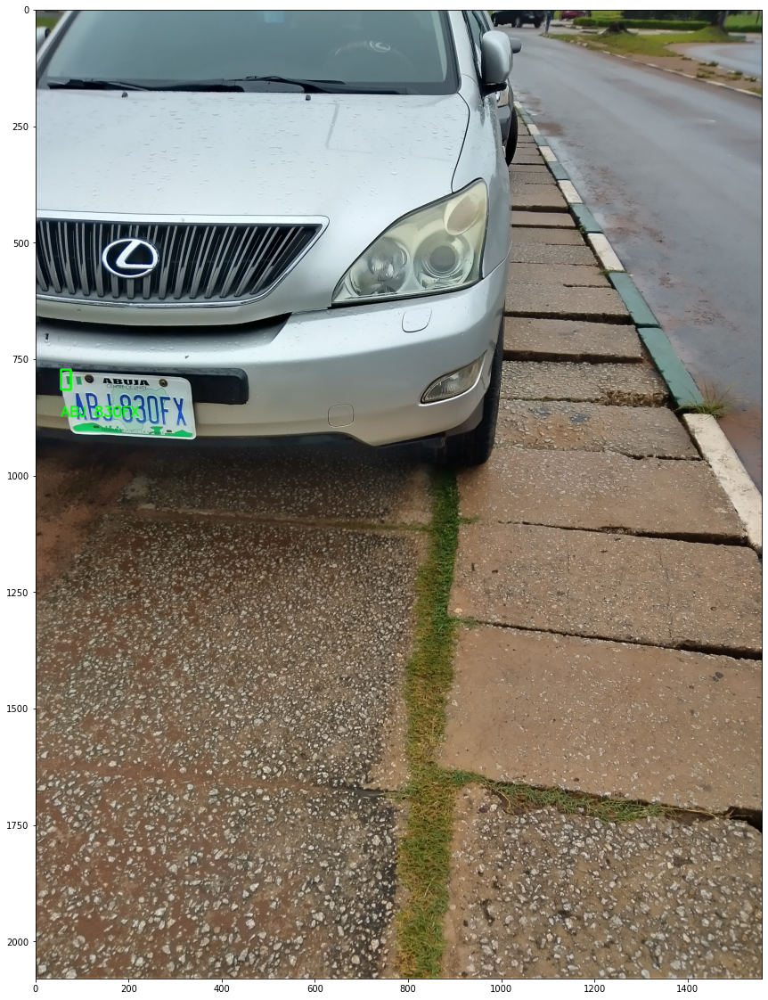

In [ ]:
# CHARACTER RECOGNITION
import easyocr
reader = easyocr.Reader(['en'])
result = reader.readtext(cropped_gray)
 
text = result[1][1]
print(text)
font = cv2.FONT_HERSHEY_SIMPLEX
res = cv2.putText(img, text,(approx[0][0][0], approx[1][0][1] + 60), font, 1, (0, 255, 0), 2, cv2.LINE_AA)
res = cv2.rectangle(img, tuple(approx[0][0]), tuple(approx[2][0]), (0, 255, 0), 3)
plt.figure(figsize=(40, 20)) 
plt.imshow(cv2.cvtColor(res, cv2.COLOR_BGR2RGB))

In [ ]:
# GETTING TRAINING DATA
 
import os
import numpy as np
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score
from sklearn.externals import joblib
import cv2
from skimage.io import imread
from skimage.filters import threshold_otsu
 
letters = [
            '0', '1', '2', '3', '4', '5', '6', '7', '8', '9', 'A', 'B', 'C', 'D',
            'E', 'F', 'G', 'H', 'J', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T',
            'U', 'V', 'W', 'X', 'Y', 'Z'
        ]
 
def read_training_data(training_directory):
    image_data = []
    target_data = []
    for each_letter in letters:
        for each in range(20):
            image_path = os.path.join(training_directory, each_letter, each_letter + '_' + str(each) + '.jpg')
            # read each image of each character
            img_details = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
            # converts each character image to binary image
            binary_image = cv2.threshold(img_details, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)[1]
            # the 2D array of each image is flattened because the machine learning
            # classifier requires that each sample is a 1D array
            # therefore the 20*20 image becomes 1*400
            # in machine learning terms that's 400 features with each pixel
            # representing a feature
            flat_bin_image = binary_image.reshape(-1)
            image_data.append(flat_bin_image)
            target_data.append(each_letter)
 
    return (np.array(image_data), np.array(target_data))
 
def cross_validation(model, num_of_fold, train_data, train_label):
    # this uses the concept of cross validation to measure the accuracy
    # of a model, the num_of_fold determines the type of validation
    # e.g if num_of_fold is 4, then we are performing a 4-fold cross validation
    # it will divide the dataset into 4 and use 1/4 of it for testing
    # and the remaining 3/4 for the training
    accuracy_result = cross_val_score(model, train_data, train_label,
                                      cv=num_of_fold)
    print("Cross Validation Result for ", str(num_of_fold), " -fold")
 
    print(accuracy_result * 100)
 
 
#current_dir = os.path.dirname(os.path.realpath(__file__))
 
#training_dataset_dir = os.path.join(current_dir, 'train')
 
#image_data, target_data = read_training_data(training_dataset_dir)
image_data, target_data = read_training_data('/content/drive/MyDrive/training_data/train20X20')

In [ ]:
# TRAIN SVM CLASSIFIER

# the kernel can be 'linear', 'poly' or 'rbf'
# the probability was set to True so as to show
# how sure the model is of it's prediction
svc_model = SVC(kernel='linear', probability=True)

cross_validation(svc_model, 4, image_data, target_data)

# let's train the model with all the input data
svc_model.fit(image_data, target_data)

# we will use the joblib module to persist the model
# into files. This means that the next time we need to
# predict, we don't need to train the model again
save_directory = '/content/drive/MyDrive'
if not os.path.exists(save_directory):
    os.makedirs(save_directory)
joblib.dump(svc_model, save_directory+'/svc.pkl')

Cross Validation Result for  4  -fold
[100. 100. 100. 100.]


['/content/drive/MyDrive/svc.pkl']

In [ ]:
# TRAIN KNN CLASSIFIER

from sklearn.neighbors import KNeighborsClassifier

# Create KNN Classifier
knn_model = KNeighborsClassifier(n_neighbors=3)
cross_validation(knn_model, 4, image_data, target_data)

# Train the model using the training sets
knn_model.fit(image_data, target_data)
# we will use the joblib module to persist the model
# into files. This means that the next time we need to
# predict, we don't need to train the model again
#save_directory = os.path.join(current_dir, 'models/svc/')
save_directory = '/content/drive/MyDrive'
if not os.path.exists(save_directory):
    os.makedirs(save_directory)
joblib.dump(knn_model, save_directory+'/knn.pkl')

Cross Validation Result for  4  -fold
[97.05882353 98.23529412 98.23529412 98.23529412]


['/content/drive/MyDrive/knn.pkl']

In [ ]:
# TRAIN NEURAL NETWORK CLASSIFIER

from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(hidden_layer_sizes=(30,30,30))
cross_validation(mlp, 4, image_data, target_data)
mlp.fit(image_data, target_data)

# we will use the joblib module to persist the model
# into files. This means that the next time we need to
# predict, we don't need to train the model again
#save_directory = os.path.join(current_dir, 'models/svc/')
save_directory = '/content/drive/MyDrive'
if not os.path.exists(save_directory):
    os.makedirs(save_directory)
joblib.dump(mlp, save_directory+'/ann.pkl')

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


Cross Validation Result for  4  -fold
[70.58823529 60.58823529 40.         55.88235294]


/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


['/content/drive/MyDrive/ann.pkl']

In [ ]:
# TEST MODEL 
 
import os
from sklearn.externals import joblib
 
# load the model
#current_dir = os.path.dirname(os.path.realpath(__file__))
model_dir = '/content/drive/MyDrive/svc.pkl'
model = joblib.load(model_dir)
 
classification_result = []
for each_character in character:
    # converts it to a 1D array
    each_character = each_character.reshape(1, -1);
    result = model.predict(each_character)
    classification_result.append(result)
 
print(classification_result)
 
plate_string = ''
for eachPredict in classification_result:
    plate_string += eachPredict[0]
 
print(plate_string)
 
'''# it's possible the characters are wrongly arranged
# since that's a possibility, the column_list will be
# used to sort the letters in the right order
 
column_list_copy = segmentation.column_list[:]
segmentation.column_list.sort()
rightplate_string = ''
for each in segmentation.column_list:
    rightplate_string += plate_string[column_list_copy.index(each)]
 
print(rightplate_string)'''

[array(['N'], dtype='<U1'), array(['B'], dtype='<U1'), array(['J'], dtype='<U1'), array(['B'], dtype='<U1'), array(['3'], dtype='<U1'), array(['D'], dtype='<U1'), array(['F'], dtype='<U1'), array(['1'], dtype='<U1')]
NBJB3DF1


"# it's possible the characters are wrongly arranged\n# since that's a possibility, the column_list will be\n# used to sort the letters in the right order\n \ncolumn_list_copy = segmentation.column_list[:]\nsegmentation.column_list.sort()\nrightplate_string = ''\nfor each in segmentation.column_list:\n    rightplate_string += plate_string[column_list_copy.index(each)]\n \nprint(rightplate_string)"

BEN347SX


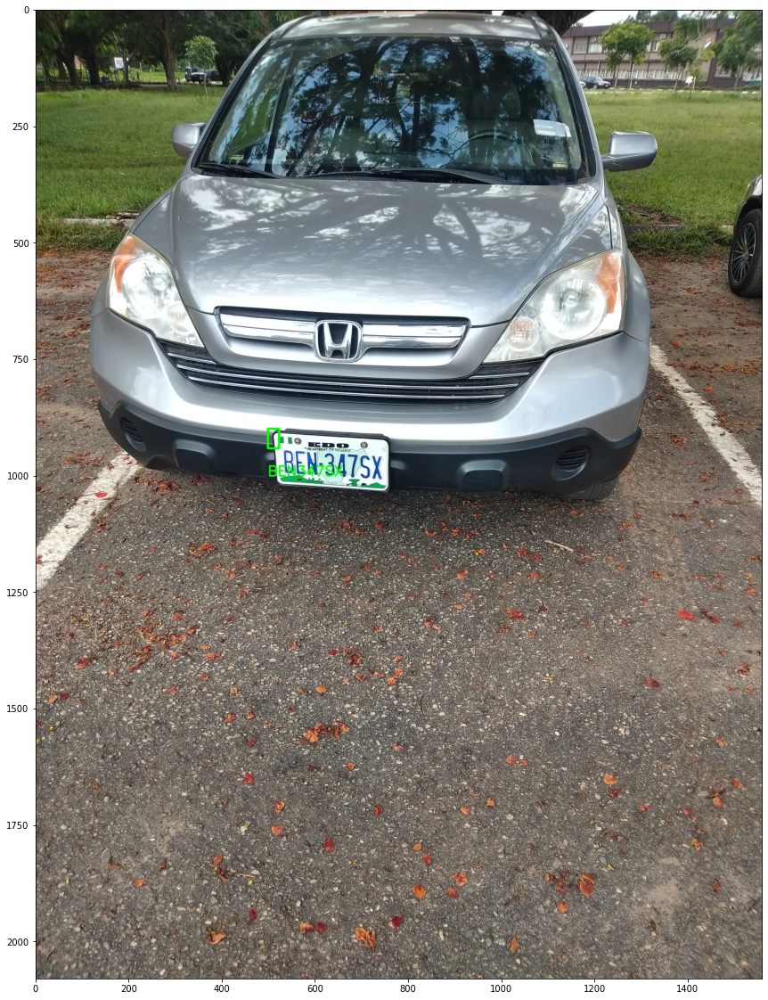

In [ ]:
text = plate_string
print(text)
font = cv2.FONT_HERSHEY_SIMPLEX
res = cv2.putText(img, text,(approx[0][0][0], approx[1][0][1] + 60), font, 1, (0, 255, 0), 2, cv2.LINE_AA)
res = cv2.rectangle(img, tuple(approx[0][0]), tuple(approx[2][0]), (0, 255, 0), 3)
plt.figure(figsize=(40, 20)) 
plt.imshow(cv2.cvtColor(res, cv2.COLOR_BGR2RGB))